In [117]:
import sys
import pandas as pd
from matplotlib import pyplot as plt
from scipy import stats
from sklearn.model_selection import train_test_split

sys.path.insert(1, '../')

from rule_extraction import *

%load_ext autoreload
%autoreload 2
%matplotlib widget

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Load Data from Folders


In [118]:
dataPairs = []

directories = []
for root, dirs, files in os.walk("../../data/data-wsl2-examples-pause/"):
    for name in dirs:
        directories.append(os.path.join(root, name))


for directory in directories:
    print(f"Processing {directory}")

    files = os.listdir(directory)

    # group files by time AutoPas_liveInfoLogger_Rank0_$2024-05-21_14-24-17$
    data_pairs = {}
    for file in files:
        if "tuningData" in file or "liveInfo" in file:
            time = file.split("_")[-1]

            if not time in data_pairs:
                data_pairs[time] = [None, None]

            if "tuningData" in file:
                data_pairs[time][1] = pd.read_csv(
                    os.path.join(directory, file))
            elif "liveInfo" in file:
                data_pairs[time][0] = pd.read_csv(
                    os.path.join(directory, file))

    # check if tuning and liveInfo files are present
    for time, pair in data_pairs.items():
        if pair[0] is None or pair[1] is None:
            print(f"Missing file for {directory} at time {time}")
            continue

    # filter rows where NaN is present

    for time, (liveInfo, tuningData) in data_pairs.items():
        tuning_iterations = tuningData["Iteration"]

        corresponding_liveInfo = liveInfo.loc[liveInfo["Iteration"].isin(
            tuning_iterations)]

        assert len(corresponding_liveInfo) == len(
            tuningData), "Length of liveInfo and tuningData does not match"

        # strip columns
        corresponding_liveInfo.columns = corresponding_liveInfo.columns.str.strip()
        tuningData.columns = tuningData.columns.str.strip()

        # merge container and Data Layout
        tuningData["Container_DataLayout"] = tuningData["Container"] + \
            "_" + tuningData["Data Layout"]

        tuningData.drop(columns=["Container", "Data Layout"], inplace=True)

        dataPairs.append((corresponding_liveInfo, tuningData))

Processing ../../data/data-wsl2-examples-pause/uniform_cube_4
Processing ../../data/data-wsl2-examples-pause/uniform_cube_1
Processing ../../data/data-wsl2-examples-pause/falling_drop
Processing ../../data/data-wsl2-examples-pause/uniform_cube_3
Processing ../../data/data-wsl2-examples-pause/uniform_cube_7
Processing ../../data/data-wsl2-examples-pause/uniform_cube_6
Processing ../../data/data-wsl2-examples-pause/uniform_cube_2
Processing ../../data/data-wsl2-examples-pause/spinodal_decomp_equilibration
Processing ../../data/data-wsl2-examples-pause/exploding_liquid
Processing ../../data/data-wsl2-examples-pause/uniform_cube_5
Processing ../../data/data-wsl2-examples-pause/spinodial_decomp


In [119]:
df = pd.DataFrame()

for batch, (X, y) in enumerate(dataPairs):
    merged = pd.merge(X, y, on="Iteration")
    df = pd.concat([df, merged])

df = df.drop(columns=["Iteration", "Date_x", "Date_y"])
df = df.drop(list(df.filter(regex='sample')), axis=1)
df.shape

(29001, 28)

In [120]:
df.describe()

,avgParticlesPerCell,cutoff,domainSizeX,domainSizeY,domainSizeZ,estimatedNumNeighborInteractions,homogeneity,maxDensity,maxParticlesPerCell,minParticlesPerCell,...,particleSize,particleSizeNeededByFunctor,particlesPerBlurredCellStdDev,particlesPerCellStdDev,rebuildFrequency,skin,threadCount,CellSizeFactor,Reduced,Smoothed
count,29000.000000,29000.000000,29000.000000,29000.000000,29000.000000,2.900000e+04,29000.000000,29000.000000,29000.000000,29000.0,...,29000.0,29000.0,29000.000000,29000.000000,29000.000000,29000.000000,29000.0,28998.0,2.899600e+04,2.899500e+04
mean,1.055021,2.915793,61.454753,62.161305,60.517003,1.307572e+05,0.085891,0.525474,20.193586,0.0,...,128.0,72.0,0.328572,0.045466,10.281897,1.064259,12.0,1.0,5.152603e+07,4.810560e+07
std,1.590832,0.231965,24.337255,23.534889,25.101769,1.920980e+05,0.103664,0.331926,7.419007,0.0,...,0.0,0.0,0.255198,0.060036,1.153284,0.504646,0.0,0.0,1.008821e+08,8.905544e+07
min,0.068390,2.000000,15.000000,29.561231,15.000000,3.285000e+03,0.003197,0.016158,3.000000,0.0,...,128.0,72.0,0.024498,0.011771,10.000000,0.200000,12.0,1.0,6.842310e+05,6.842310e+05
25%,0.305312,3.000000,50.000000,50.000000,50.000000,3.356400e+04,0.027972,0.212400,16.000000,0.0,...,128.0,72.0,0.215287,0.017843,10.000000,1.000000,12.0,1.0,1.546688e+07,1.485115e+07
50%,0.547120,3.000000,50.000000,50.000000,50.000000,8.085200e+04,0.044302,0.520800,22.000000,0.0,...,128.0,72.0,0.299439,0.040432,10.000000,1.000000,12.0,1.0,2.562834e+07,2.468236e+07
75%,0.944637,3.000000,100.000000,100.000000,100.000000,9.396900e+04,0.082399,0.688200,24.000000,0.0,...,128.0,72.0,0.349292,0.045114,10.000000,1.000000,12.0,1.0,4.520055e+07,4.347496e+07
max,7.061688,3.000000,100.000000,100.000000,100.000000,1.032785e+06,0.547827,1.879647,51.000000,0.0,...,128.0,72.0,2.008868,0.478737,15.000000,3.000000,12.0,1.0,2.168150e+09,1.934718e+09


In [121]:
df.columns

Index(['avgParticlesPerCell', 'cutoff', 'domainSizeX', 'domainSizeY',
       'domainSizeZ', 'estimatedNumNeighborInteractions', 'homogeneity',
       'maxDensity', 'maxParticlesPerCell', 'minParticlesPerCell', 'numCells',
       'numEmptyCells', 'numHaloParticles', 'numParticles', 'particleSize',
       'particleSizeNeededByFunctor', 'particlesPerBlurredCellStdDev',
       'particlesPerCellStdDev', 'rebuildFrequency', 'skin', 'threadCount',
       'CellSizeFactor', 'Traversal', 'Load Estimator', 'Newton 3', 'Reduced',
       'Smoothed', 'Container_DataLayout'],
      dtype='object')

# Define Interesting Data to observe


In [122]:
inputs = [
    "avgParticlesPerCell",
    # "cutoff",
    # "domainSizeX",
    # "domainSizeY",
    # "domainSizeZ",
    # "estimatedNumNeighborInteractions",
    'homogeneity',
    'maxDensity',
    "maxParticlesPerCell",
    # "minParticlesPerCell",
    # "numCells",
    # "numEmptyCells",
    # "numHaloParticles",
    # "numParticles",
    # "particleSize",
    # "particleSizeNeededByFunctor",
    # "particlesPerBlurredCellStdDev",
    "particlesPerCellStdDev",
    # "rebuildFrequency",
    # "skin",
    # "threadCount",
]

outputs = [
    "Container_DataLayout",
    # "CellSizeFactor",
    "Traversal",
    # "Load Estimator",
    "Newton 3",
]

In [123]:
df.columns

Index(['avgParticlesPerCell', 'cutoff', 'domainSizeX', 'domainSizeY',
       'domainSizeZ', 'estimatedNumNeighborInteractions', 'homogeneity',
       'maxDensity', 'maxParticlesPerCell', 'minParticlesPerCell', 'numCells',
       'numEmptyCells', 'numHaloParticles', 'numParticles', 'particleSize',
       'particleSizeNeededByFunctor', 'particlesPerBlurredCellStdDev',
       'particlesPerCellStdDev', 'rebuildFrequency', 'skin', 'threadCount',
       'CellSizeFactor', 'Traversal', 'Load Estimator', 'Newton 3', 'Reduced',
       'Smoothed', 'Container_DataLayout'],
      dtype='object')

In [124]:
SPEEDUP_CUT = 0.7

group_by = [
    "avgParticlesPerCell",
    "cutoff",
    "domainSizeX",
    "domainSizeY",
    "domainSizeZ",
    "estimatedNumNeighborInteractions",
    'homogeneity',
    'maxDensity',
    "maxParticlesPerCell",
    "minParticlesPerCell",
    "numCells",
    "numEmptyCells",
    "numHaloParticles",
    "numParticles",
    "particleSize",
    "particleSizeNeededByFunctor",
    "particlesPerBlurredCellStdDev",
    "particlesPerCellStdDev",
    "rebuildFrequency",
    "skin",
    "threadCount",
]


# only keep rows where performance percentage is above x
print("Orignal length", len(df))

# group data on input columns
grouped = df.groupby(group_by)


def add_Speedup_column(group):
    min_smoothed = group['Smoothed'].min()
    result = group.copy()
    result['speedup'] = min_smoothed / result['Smoothed']
    return result


grouped_speedup = grouped.apply(
    add_Speedup_column).reset_index(drop=True)

grouped_speedup.drop(columns=["Smoothed", "Reduced"], inplace=True)


def filter_groups(group):
    return group[group['speedup'] > SPEEDUP_CUT]


 # only keep rows where best_smoothed/current_smoothed is above 0.7
filtered_groups = grouped_speedup.groupby(
    group_by).apply(filter_groups).reset_index(drop=True)


print("Filtered length", len(filtered_groups))


def unique_string_elems(row):
    return ", ".join(sorted(map(str, list(np.unique(row)))))


# Combine all string columns into unique values
combined = filtered_groups.groupby(inputs).agg(
    unique_string_elems).reset_index()

print("Combined length", len(combined))

Orignal length 29001


/tmp/ipykernel_263910/1116841007.py:42: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  grouped_speedup = grouped.apply(
/tmp/ipykernel_263910/1116841007.py:54: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  group_by).apply(filter_groups).reset_index(drop=True)


Filtered length 2314
Combined length 554


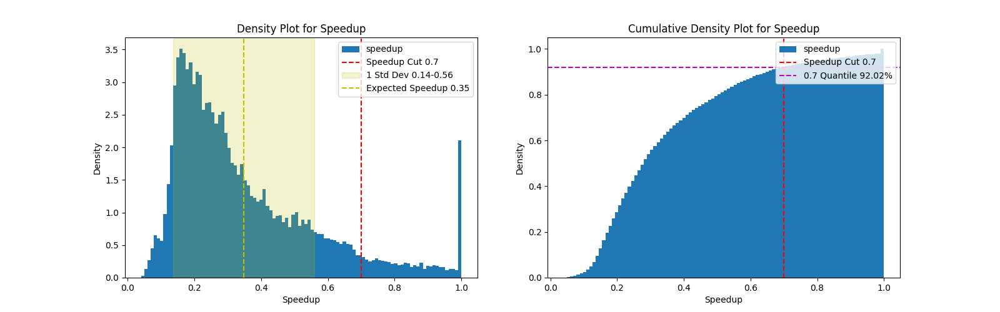

In [125]:
fig, ax = plt.subplots(1, 2, figsize=(16, 5))

# relative performance
grouped_speedup["speedup"].plot.hist(
    bins=100, ax=ax[0], density=True)
ax[0].set_title("Density Plot for Speedup")
ax[0].set_xlabel("Speedup")
ax[0].set_ylabel("Density")
ax[0].axvline(x=SPEEDUP_CUT, color='r',
              linestyle='--', label=f"Speedup Cut {SPEEDUP_CUT}")

expectation = grouped_speedup["speedup"].mean()
std_dev = grouped_speedup["speedup"].std()

ax[0].axvspan(expectation-std_dev, expectation+std_dev, color='y', alpha=0.2,
              label=f"1 Std Dev {np.round(expectation-std_dev, 2)}-{np.round(expectation+std_dev, 2)}")

ax[0].axvline(x=expectation, color='y', linestyle='--',
              label=f"Expected Speedup {np.round(expectation, 2)}")

ax[0].legend(loc='upper right')

# cummulative distribution
grouped_speedup["speedup"].plot.hist(
    bins=100, ax=ax[1], density=True, cumulative=True)
ax[1].set_title("Cumulative Density Plot for Speedup")
ax[1].set_xlabel("Speedup")
ax[1].set_ylabel("Density")
ax[1].axvline(x=SPEEDUP_CUT, color='r',
              linestyle='--', label=f"Speedup Cut {np.round(SPEEDUP_CUT, 2)}")

value_at_top_performance = 1-len(filtered_groups) / len(df)

ax[1].axhline(y=value_at_top_performance, color='m',
              linestyle='--', label=f"{SPEEDUP_CUT} Quantile {np.round(100*value_at_top_performance, 2)}%")
ax[1].legend(loc='upper right')

# Filter Data / Outliers


In [126]:
combined

,avgParticlesPerCell,homogeneity,maxDensity,maxParticlesPerCell,particlesPerCellStdDev,cutoff,domainSizeX,domainSizeY,domainSizeZ,estimatedNumNeighborInteractions,...,particlesPerBlurredCellStdDev,rebuildFrequency,skin,threadCount,CellSizeFactor,Traversal,Load Estimator,Newton 3,Container_DataLayout,speedup
0,0.068390,0.011425,0.137728,6.0,0.037998,3.0,100.0,100.0,100.0,22005.0,...,0.632081,10.0,1.0,12.0,1.0,"lc_c08, lc_c18, vl_list_iteration, vlc_c01, vl...",none,"disabled, enabled","LinkedCells_AoS, VerletListsCells_AoS, VerletL...","0.7513679720152159, 0.8327118800817513, 0.8679..."
1,0.068390,0.011827,0.143646,8.0,0.040706,3.0,100.0,100.0,100.0,25228.0,...,0.632583,10.0,1.0,12.0,1.0,"lc_c08, lc_c18, vl_list_iteration, vlc_c01, vl...",none,"disabled, enabled","LinkedCells_AoS, VerletListsCells_AoS, VerletL...","0.7282653123976539, 0.7352700424237795, 0.8472..."
2,0.068390,0.011865,0.143108,10.0,0.042064,3.0,100.0,100.0,100.0,26927.0,...,0.632416,10.0,1.0,12.0,1.0,"lc_c08, lc_c18, vl_list_iteration, vlc_c01, vl...",none,"disabled, enabled","LinkedCells_AoS, VerletListsCells_AoS, VerletL...","0.7101531585561377, 0.7270815134632995, 0.7931..."
3,0.068390,0.011914,0.145260,6.0,0.037742,3.0,100.0,100.0,100.0,21712.0,...,0.632081,10.0,1.0,12.0,1.0,"lc_c08, lc_c18, vl_list_iteration, vlc_c18",none,"disabled, enabled","LinkedCells_AoS, VerletListsCells_AoS, VerletL...","0.7688681951776479, 0.8515288478042887, 0.8999..."
4,0.068390,0.011914,0.145260,8.0,0.039920,3.0,100.0,100.0,100.0,24269.0,...,0.632081,10.0,1.0,12.0,1.0,"lc_c08, lc_c18, vl_list_iteration, vlc_c01, vl...",none,"disabled, enabled","LinkedCells_AoS, VerletListsCells_AoS, VerletL...","0.7954209590509281, 0.8172393279359957, 0.9210..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,7.061688,0.183484,0.815249,23.0,0.015876,3.0,40.6,40.6,30.6,346051.0,...,0.08996,10.0,1.0,12.0,1.0,"lc_c08, vlc_c18",none,enabled,"LinkedCells_SoA, VerletListsCells_AoS","0.8585743296153516, 1.0"
550,7.061688,0.245347,0.966221,29.0,0.020153,3.0,40.6,40.6,30.6,420795.0,...,0.138568,10.0,1.0,12.0,1.0,"lc_c08, lc_c18, vlc_c01, vlc_c18",none,"disabled, enabled","LinkedCells_SoA, VerletListsCells_AoS","0.713229775437496, 0.8519973165935084, 0.92321..."
551,7.061688,0.360971,1.117193,29.0,0.026916,3.0,40.6,40.6,30.6,575197.0,...,0.205218,10.0,1.0,12.0,1.0,"lc_c08, lc_c18, vl_list_iteration, vlc_c01, vl...",none,"disabled, enabled","LinkedCells_SoA, VerletListsCells_AoS, VerletL...","0.7314466193412201, 0.7463424491816801, 0.8189..."
552,7.061688,0.381460,1.268165,24.0,0.029376,3.0,40.6,40.6,30.6,642370.0,...,0.186311,10.0,1.0,12.0,1.0,"lc_c01, lc_c08, lc_c18, vlc_c18",none,"disabled, enabled","LinkedCells_SoA, VerletListsCells_AoS","0.7563218778855513, 0.8945779892593054, 0.9133..."


In [127]:
Z_THRESHHOLD = 3
for column in inputs:
    z = np.abs(stats.zscore(combined[column]))
    combined = combined[z < Z_THRESHHOLD]

print("Outliers removed length", len(combined))


# filter values occuring less than pct
SPARSE_CUTOFF = 0.01
for column in outputs:
    counts = combined[column].value_counts()

    sparse_values = combined[column].isin(
        counts[counts > len(combined) * SPARSE_CUTOFF].index)

    combined = combined[sparse_values]


print("Sparse values removed length", len(combined))

X, y = combined[inputs], combined[outputs]
print(X.shape, y.shape)

Outliers removed length 481
Sparse values removed length 394
(394, 5) (394, 3)


# Create Train and Test Data


In [128]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42)

# save to csv
pd.concat([X_train, y_train], axis=1).to_pickle("train.pkl")
pd.concat([X_test, y_test], axis=1).to_pickle("test.pkl")

# Final Data


In [129]:
pd.concat([X_train, y_train], axis=1).head()

,avgParticlesPerCell,homogeneity,maxDensity,maxParticlesPerCell,particlesPerCellStdDev,Container_DataLayout,Traversal,Newton 3
413,0.944637,0.081462,0.569160,22.0,0.041219,"LinkedCells_SoA, VerletListsCells_AoS, VerletL...","lc_c08, vl_list_iteration, vlc_c01","disabled, enabled"
248,0.547120,0.042829,0.561672,23.0,0.044775,"VerletClusterLists_SoA, VerletListsCells_AoS, ...","vcl_c01_balanced, vl_list_iteration, vlc_c01",disabled
238,0.547120,0.042586,0.307736,17.0,0.045086,"VerletClusterLists_SoA, VerletListsCells_AoS, ...","vcl_c01_balanced, vl_list_iteration, vlc_c01",disabled
118,0.305312,0.024291,0.213600,20.0,0.017356,"VerletListsCells_AoS, VerletLists_AoS","vl_list_iteration, vlc_c01, vlc_c18","disabled, enabled"
426,0.944637,0.081745,0.725400,25.0,0.040173,"VerletListsCells_AoS, VerletLists_AoS","vl_list_iteration, vlc_c01",disabled


In [130]:
for i, col in enumerate(y.columns):

    y_count = y[col].value_counts()

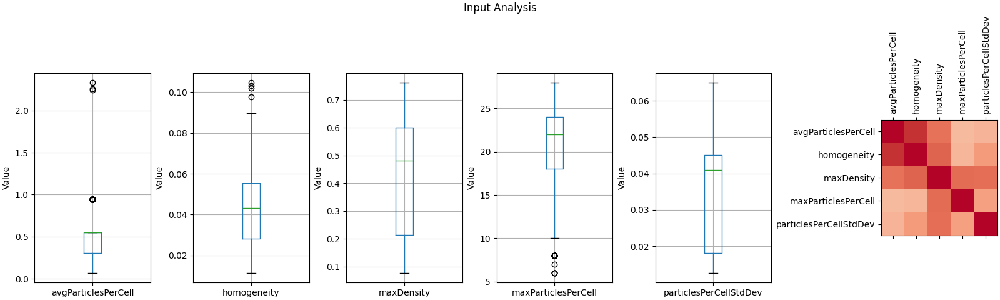

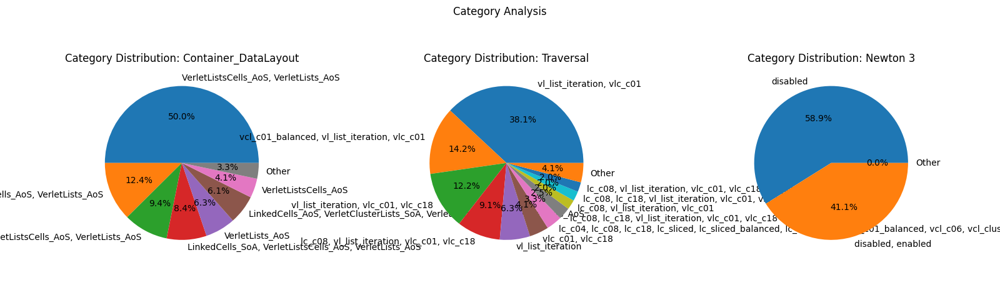

In [131]:
import seaborn as sns

# Row 1
fig, ax1 = plt.subplots(1, len(X.columns)+1, constrained_layout=True)

fig.suptitle("Input Analysis")
fig.set_figwidth(16)

for i, col in enumerate(X.columns):
    X[[col]].boxplot(ax=ax1[i], showfliers=True)
    ax1[i].set_ylabel("Value")

i += 1
# Correlation Matrix
corr = X.corr()
cax = ax1[i].matshow(corr, cmap='coolwarm', vmin=-1, vmax=1)
ax1[i].set_xticks(range(len(X.columns)))
ax1[i].set_yticks(range(len(X.columns)))
ax1[i].set_xticklabels(X.columns, rotation=90)
ax1[i].set_yticklabels(X.columns)


# Row 2
fig, ax1 = plt.subplots(1, len(y_train.columns))
fig.suptitle("Category Analysis")
fig.set_figwidth(16)
fig.tight_layout(pad=3.0)


for i, col in enumerate(y.columns):
    y_count = y[col].value_counts()

    total = y_count.sum()

    # grouping categories with less than 2% of the total
    y_count_group = y_count[y_count.gt(total*0.02)]
    y_count_group["Other"] = y_count[~y_count.index.isin(
        y_count_group.index)].sum()

    ax1[i].pie(y_count_group, labels=y_count_group.index, autopct='%1.1f%%')
    ax1[i].set_title(f"Category Distribution: {col}")

# Train Decision Tree and Extract Rules


In [132]:
# number of input parameters that can be used simultaneously
POSSIBLE_NUMBER_OF_COMBINATIONS = [2, 3, 4, 5]

CCP_ALPHA = {
    "Container_DataLayout": 0.1,
    "Traversal": 0.08,
    "Newton 3": 0.02,
}

# maximum depth of the decision tree
MAX_DEPTH = 10

# how many models should be created for each label
TOP_K_MODELS_PER_LABEL = 2

Training on 315 samples
Number of rules 89:
	Container_DataLayout (35 rules)
	Traversal (34 rules)
	Newton 3 (20 rules)


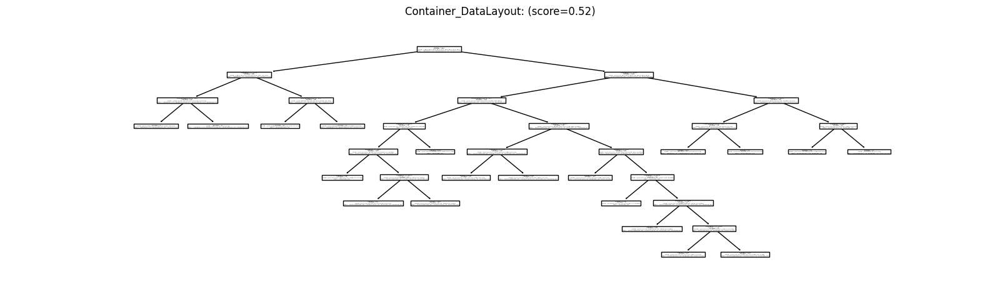

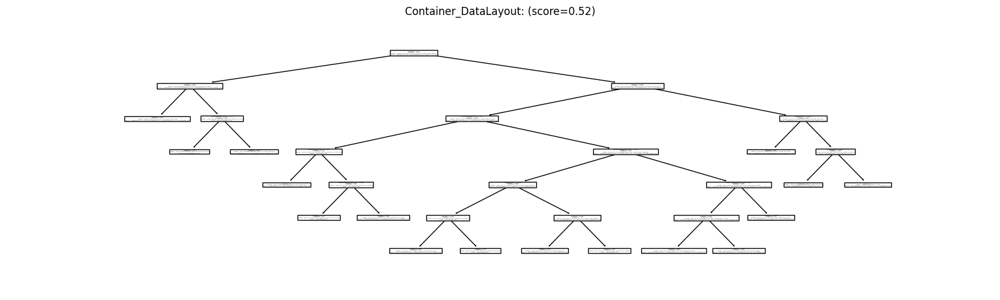

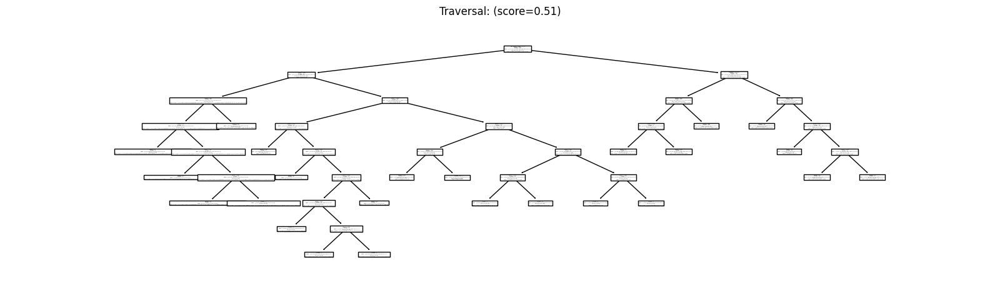

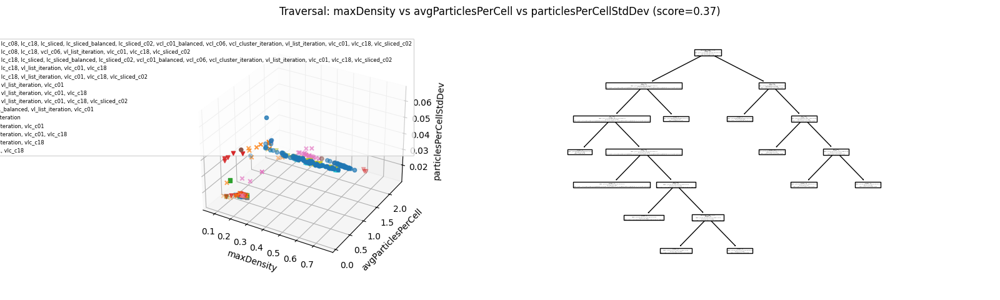

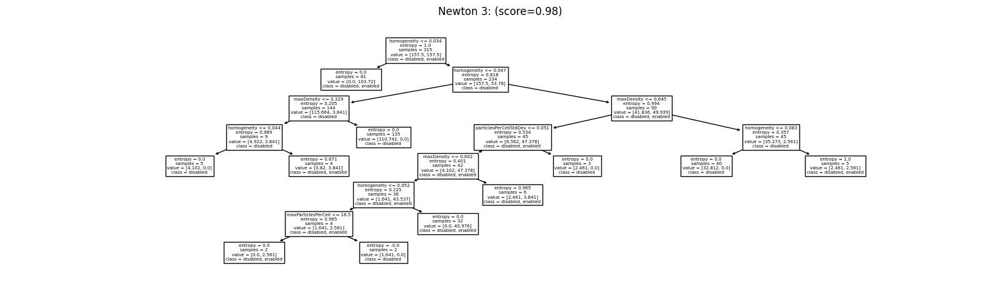

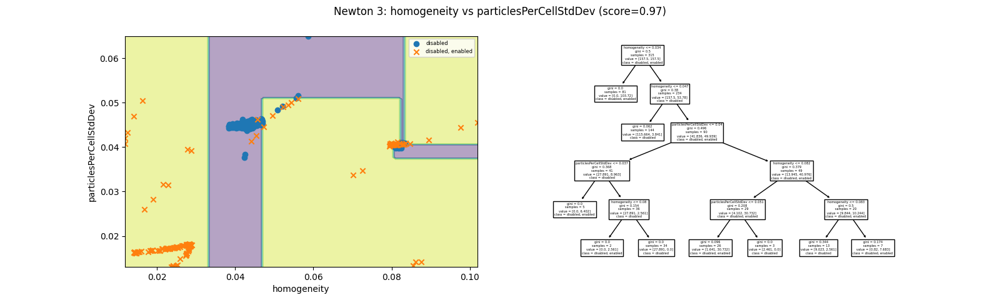

In [133]:
auto_rules = create_auto_rules(X_train, y_train,  None,
                               POSSIBLE_NUMBER_OF_COMBINATIONS, CCP_ALPHA, MAX_DEPTH, TOP_K_MODELS_PER_LABEL)

homogeneity: [-inf, 0.014, 0.015, 0.016, 0.019, 0.023, 0.024, 0.025, 0.034, 0.04, 0.043, 0.044, 0.045, 0.047, 0.052, 0.08, 0.081, 0.082, 0.083, 0.084, inf]
homogeneity: [-inf, 0.014, 0.015, 0.016, 0.019, 0.023, 0.024, 0.025, 0.034, 0.04, 0.043, 0.044, 0.045, 0.047, 0.052, 0.08, 0.081, 0.082, 0.083, 0.084, inf]

maxDensity: [-inf, 0.181, 0.329, 0.481, 0.523, 0.526, 0.54, 0.563, 0.565, 0.598, 0.602, 0.645, 0.679, 0.694, 0.751, inf]
maxDensity: [-inf, 0.181, 0.329, 0.481, 0.523, 0.54, 0.563, 0.598, 0.645, 0.679, 0.694, 0.751, inf]

avgParticlesPerCell: [-inf, 0.161, 0.308, 0.342, 0.587, 1.594, inf]
avgParticlesPerCell: [-inf, 0.161, 0.308, 0.587, 1.594, inf]

maxParticlesPerCell: [-inf, 11.0, 14.5, 16.5, 18.5, 23.5, inf]
maxParticlesPerCell: [-inf, 11.0, 14.5, 16.5, 18.5, 23.5, inf]

particlesPerCellStdDev: [-inf, 0.013, 0.015, 0.016, 0.017, 0.018, 0.022, 0.035, 0.037, 0.039, 0.04, 0.041, 0.045, 0.046, 0.051, inf]
particlesPerCellStdDev: [-inf, 0.013, 0.015, 0.016, 0.017, 0.018, 0.022, 0.

/home/manuel/AutoPas-FuzzyTuning-Bachelor-Thesis/data-analysis/../demo/fuzzy-test/python/fuzzy_system.py:409: RuntimeWarning: overflow encountered in exp
  def function(x): return 1 / (1 + np.exp(-width * (x - center)))


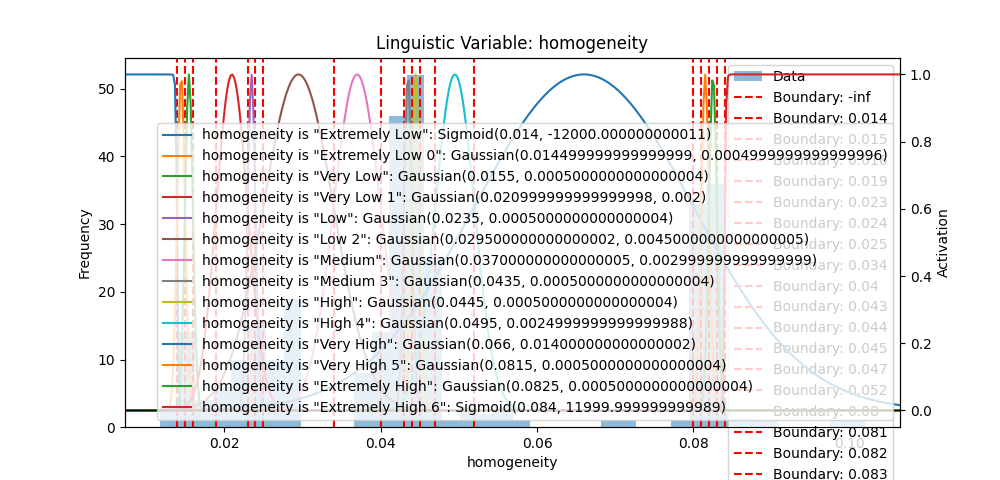

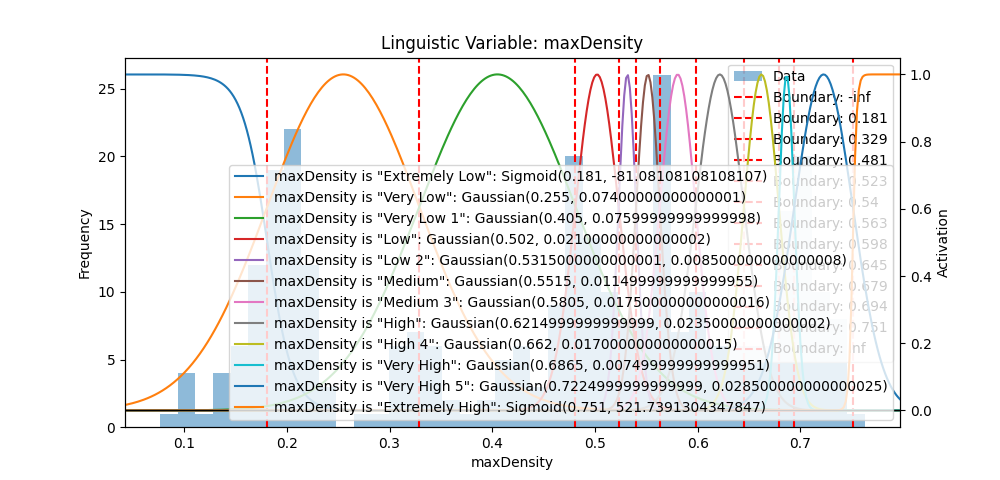

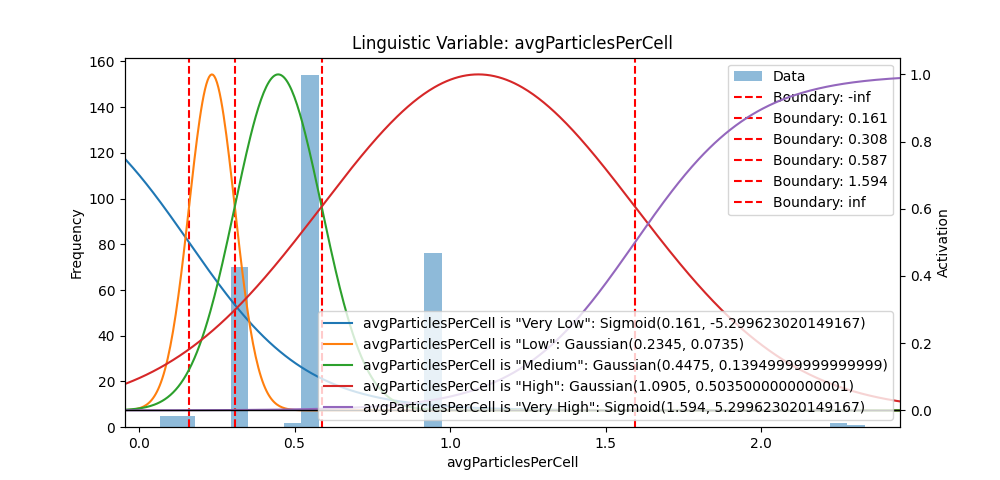

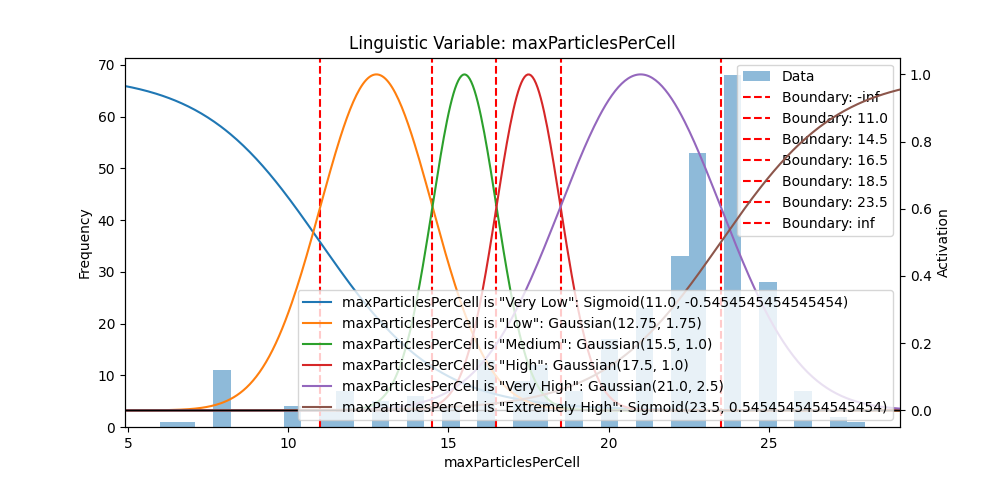

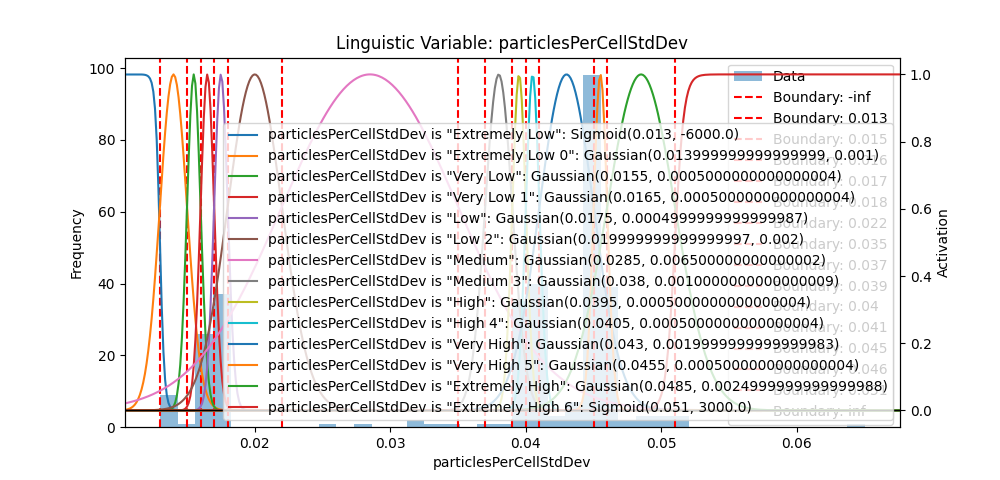

In [134]:
inputs_approach1, rules_approach1 = create_rules_approach1(
    X_train, auto_rules)

# Aproach 2

Follows https://www.sciencedirect.com/science/article/pii/S0165011406002533


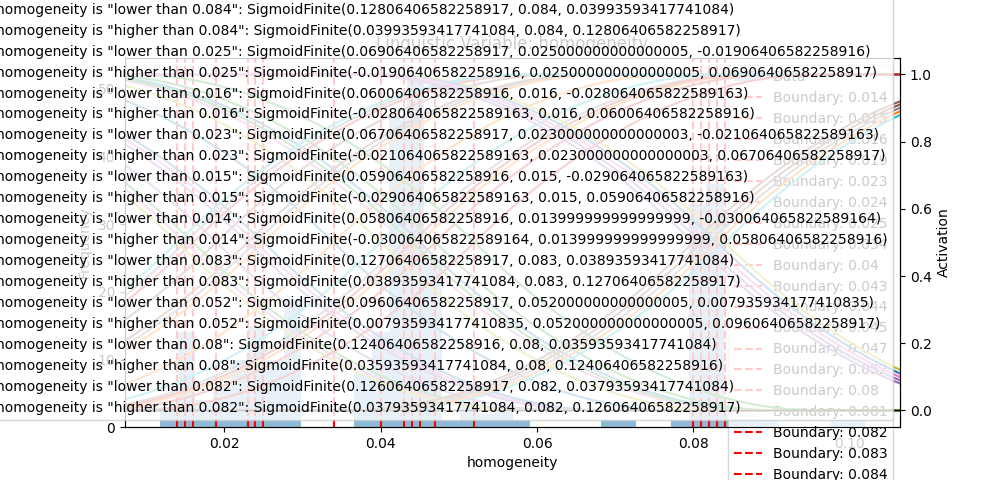

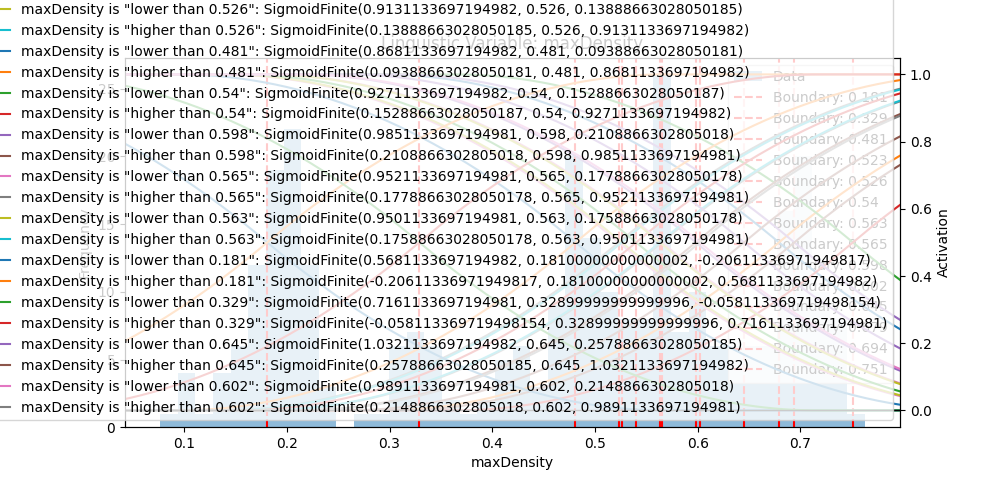

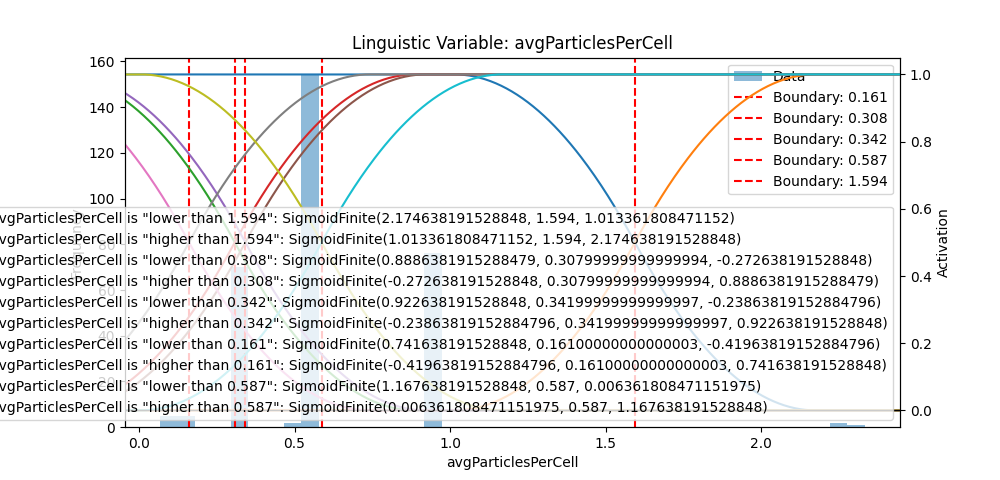

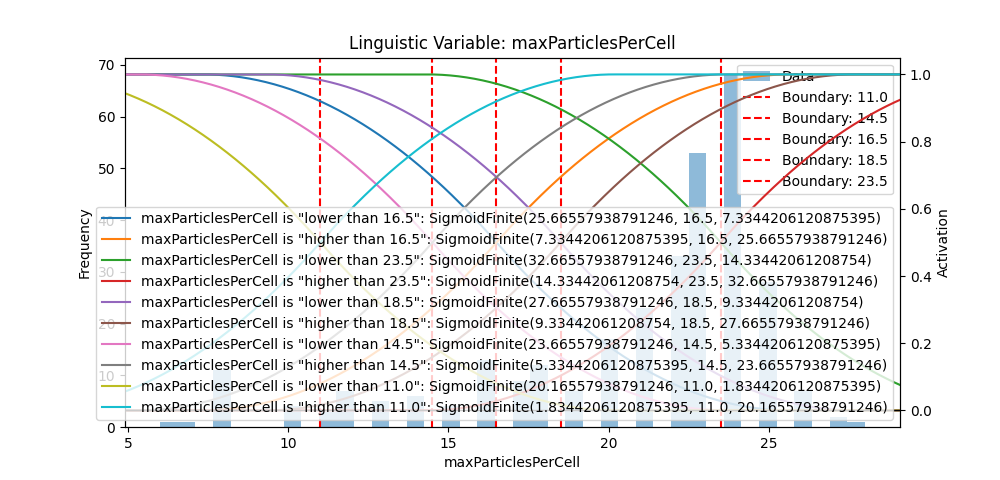

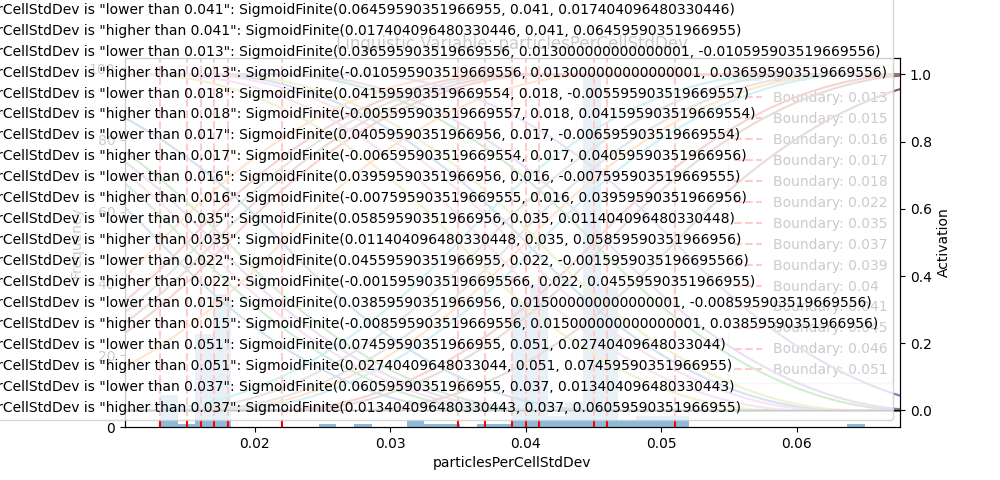

In [135]:
inputs_approach_2, rules_approach2 = create_rules_approach2(
    X_train, auto_rules)

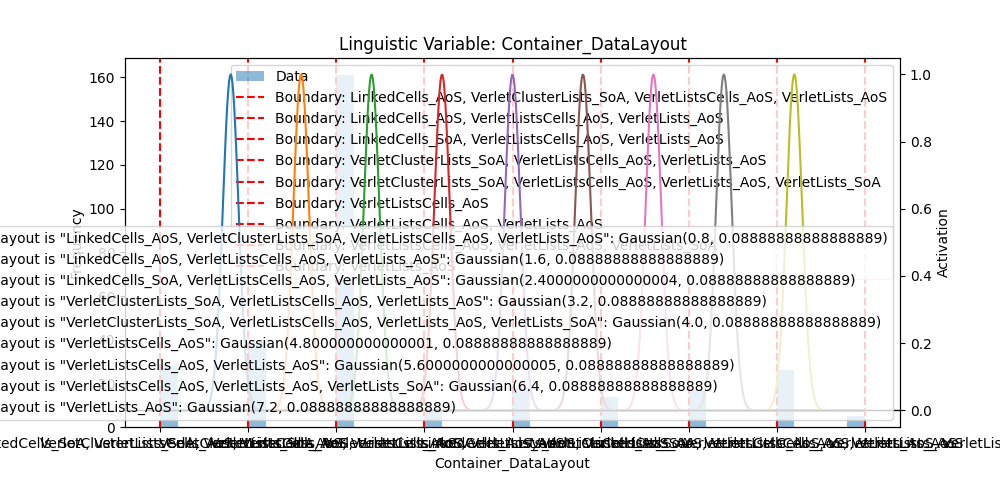

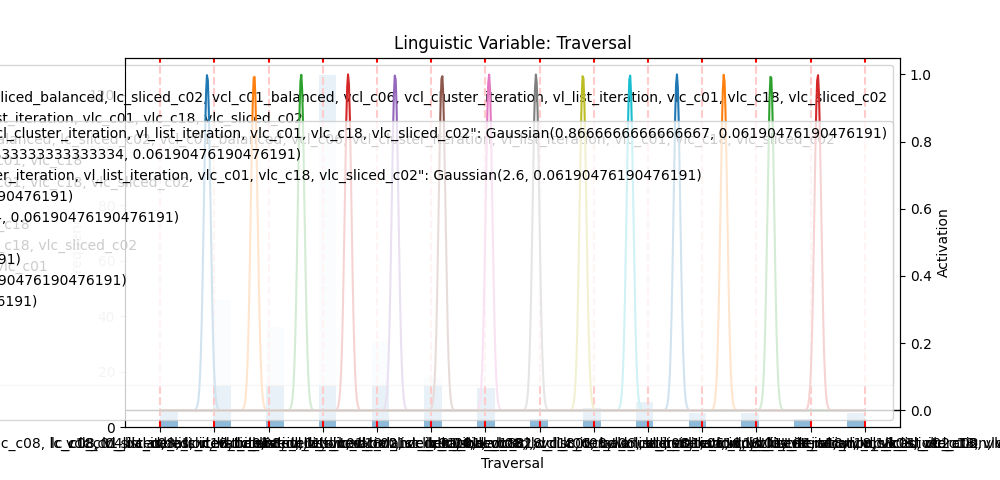

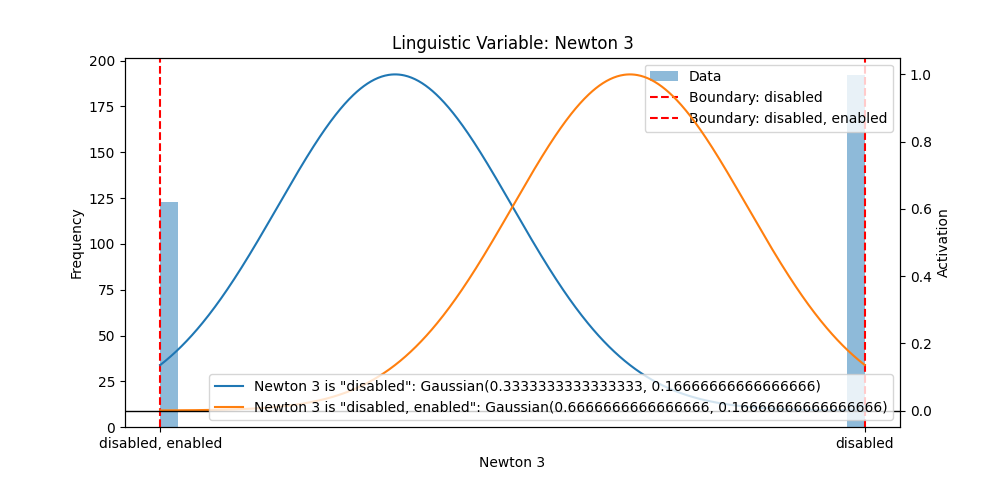

In [136]:
outputRangeMembershipFunctions = create_output_membership_functions(y_train)

# Save all the data


In [137]:
save_linguistic_variables(inputs_approach1, "approach1/fuzzy-inputs.txt")
save_linguistic_variables(outputRangeMembershipFunctions,
                          "approach1/fuzzy-outputs.txt")

save_fuzzy_rules(rules_approach1, "approach1/fuzzy-rules.txt")


save_linguistic_variables(inputs_approach_2, "approach2/fuzzy-inputs.txt")
save_linguistic_variables(outputRangeMembershipFunctions,
                          "approach2/fuzzy-outputs.txt")

save_fuzzy_rules(rules_approach2, "approach2/fuzzy-rules.txt")

FuzzyVariable: domain: "homogeneity" range: (-0.03223706582258916, 0.14597206582258915)
	"Extremely Low": Sigmoid(0.014, -12000.000000000011)
	"Extremely Low 0": Gaussian(0.014499999999999999, 0.0004999999999999996)
	"Very Low": Gaussian(0.0155, 0.0005000000000000004)
	"Very Low 1": Gaussian(0.020999999999999998, 0.002)
	"Low": Gaussian(0.0235, 0.0005000000000000004)
	"Low 2": Gaussian(0.029500000000000002, 0.0045000000000000005)
	"Medium": Gaussian(0.037000000000000005, 0.002999999999999999)
	"Medium 3": Gaussian(0.0435, 0.0005000000000000004)
	"High": Gaussian(0.0445, 0.0005000000000000004)
	"High 4": Gaussian(0.0495, 0.0024999999999999988)
	"Very High": Gaussian(0.066, 0.014000000000000002)
	"Very High 5": Gaussian(0.0815, 0.0005000000000000004)
	"Extremely High": Gaussian(0.0825, 0.0005000000000000004)
	"Extremely High 6": Sigmoid(0.084, 11999.999999999989)

FuzzyVariable: domain: "maxDensity" range: (-0.3103133697194982, 1.1497133697194981)
	"Extremely Low": Sigmoid(0.181, -81.081